<a href="https://colab.research.google.com/github/Bhuvana908/Diabetic-Retinopathy-using-AI-ML-Summer-Research-Internship-NITC-/blob/main/DR5/DR5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install -q kaggle scikit-image seaborn joblib tqdm albumentations grad-cam
!pip install -q torch-geometric
!pip install -q brisque
from google.colab import files
files.upload()
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
print("✅ Kaggle configured")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 66.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.7/63.7 kB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 29.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.8/40.8 kB 3.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.5/155.5 kB 9.1 MB/s eta 0:00:00


Saving kaggle.json to kaggle.json
✅ Kaggle configured


In [ ]:
import os
DOWNLOAD_DIR = "/content/aptos"
os.makedirs(DOWNLOAD_DIR, exist_ok=True)

!kaggle datasets download \
    -d mariaherrerot/aptos2019 \
    -p {DOWNLOAD_DIR}

!ls -lh /content/aptos
!unzip -q /content/aptos/aptos2019.zip -d /content/aptos
print("✅ Dataset extracted")

for root, dirs, files_list in os.walk("/content/aptos"):
    print(root)
    print("Folders:", dirs[:3])
    print("Files:", files_list[:3])
    print("-"*40)

Dataset URL: https://www.kaggle.com/datasets/mariaherrerot/aptos2019
License(s): unknown
100% 8.01G/8.01G [01:15<00:00, 113MB/s]

total 8.1G
-rw-r--r-- 1 root root 8.1G Nov 17  2021 aptos2019.zip
✅ Dataset extracted
/content/aptos
Folders: ['train_images', 'test_images', 'val_images']
Files: ['aptos2019.zip', 'valid.csv', 'train_1.csv']
----------------------------------------
/content/aptos/train_images
Folders: ['train_images']
Files: []
----------------------------------------
/content/aptos/train_images/train_images
Folders: []
Files: ['4b6cb0bcfd44.png', 'b376def52ccc.png', 'd6b109c82067.png']
----------------------------------------
/content/aptos/test_images
Folders: ['test_images']
Files: []
----------------------------------------
/content/aptos/test_images/test_images
Folders: []
Files: ['f6d760566a51.png', 'f361060eda3e.png', 'f7116e7b2f4e.png']
----------------------------------------
/content/aptos/val_images
Folders: ['val_images']
Files: []
------------------------------

In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch_geometric
from pathlib import Path
from tqdm import tqdm

from skimage.segmentation import slic, mark_boundaries
from skimage.util import img_as_float
from skimage.color import rgb2lab
from skimage import measure
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler

from torch_geometric.data import Data
from torch_geometric.nn import GATConv

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print(f"✅ Libraries imported")
print(f"✅ PyTorch     : {torch.__version__}")
print(f"✅ PyG         : {torch_geometric.__version__}")
print(f"✅ CUDA        : {torch.cuda.is_available()}")
print(f"✅ Device      : {DEVICE}")

✅ Libraries imported
✅ PyTorch     : 2.11.0+cu128
✅ PyG         : 2.7.0
✅ CUDA        : True
✅ Device      : cuda


In [ ]:
from pathlib import Path

DATA_DIR  = Path("/content/aptos")
TRAIN_CSV = DATA_DIR / "train_1.csv"
IMG_DIR   = DATA_DIR / "train_images/train_images"

GRADE_LABELS = {
    0: "No DR",
    1: "Mild",
    2: "Moderate",
    3: "Severe",
    4: "Proliferative DR",
}

df = pd.read_csv(TRAIN_CSV)
df["img_path"]   = df["id_code"].apply(lambda x: str(IMG_DIR / f"{x}.png"))
df["exists"]     = df["img_path"].apply(os.path.isfile)
df["grade_name"] = df["diagnosis"].map(GRADE_LABELS)
df = df[df["exists"]].reset_index(drop=True)

print(f"✅ Total valid images: {len(df)}")
print(df["grade_name"].value_counts())
df.head()

✅ Total valid images: 2930
grade_name
No DR               1434
Moderate             808
Mild                 300
Proliferative DR     234
Severe               154
Name: count, dtype: int64


,id_code,diagnosis,img_path,exists,grade_name
0,1ae8c165fd53,2,/content/aptos/train_images/train_images/1ae8c...,True,Moderate
1,1b329a127307,1,/content/aptos/train_images/train_images/1b329...,True,Mild
2,1b32e1d775ea,4,/content/aptos/train_images/train_images/1b32e...,True,Proliferative DR
3,1b3647865779,0,/content/aptos/train_images/train_images/1b364...,True,No DR
4,1b398c0494d1,0,/content/aptos/train_images/train_images/1b398...,True,No DR


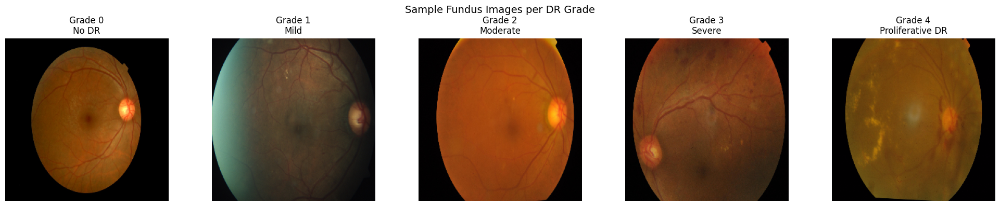

In [ ]:
fig, axes = plt.subplots(1, 5, figsize=(20, 4))
for grade in range(5):
    row = df[df["diagnosis"] == grade].iloc[0]
    img = cv2.cvtColor(cv2.imread(row["img_path"]), cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (256, 256))
    axes[grade].imshow(img)
    axes[grade].set_title(f"Grade {grade}\n{GRADE_LABELS[grade]}")
    axes[grade].axis("off")
plt.suptitle("Sample Fundus Images per DR Grade", fontsize=14)
plt.tight_layout()
plt.show()

In [ ]:
# ── Hyperparameters (paper-aligned) ──────────────────────────────────────────
IMG_SIZE     = 512    # resize target

# SLIC superpixel settings
N_SEGMENTS   = 150    # number of superpixels per image
COMPACTNESS  = 15     # shape regularity (higher = more square)
SIGMA        = 1      # pre-smoothing before SLIC

# Graph settings
K_NEIGHBOURS = 8      # k-NN edges per node

# GAT model settings
HIDDEN_DIM   = 128
NUM_LAYERS   = 3
NUM_HEADS    = 4
DROPOUT      = 0.2

# Training
EPOCHS       = 80
LR           = 5e-4

print("✅ Config ready")
print(f"   IMG_SIZE={IMG_SIZE}, N_SEGMENTS={N_SEGMENTS}, K={K_NEIGHBOURS}")
print(f"   Hidden={HIDDEN_DIM}, Layers={NUM_LAYERS}, Heads={NUM_HEADS}")

✅ Config ready
   IMG_SIZE=512, N_SEGMENTS=150, K=8
   Hidden=128, Layers=3, Heads=4


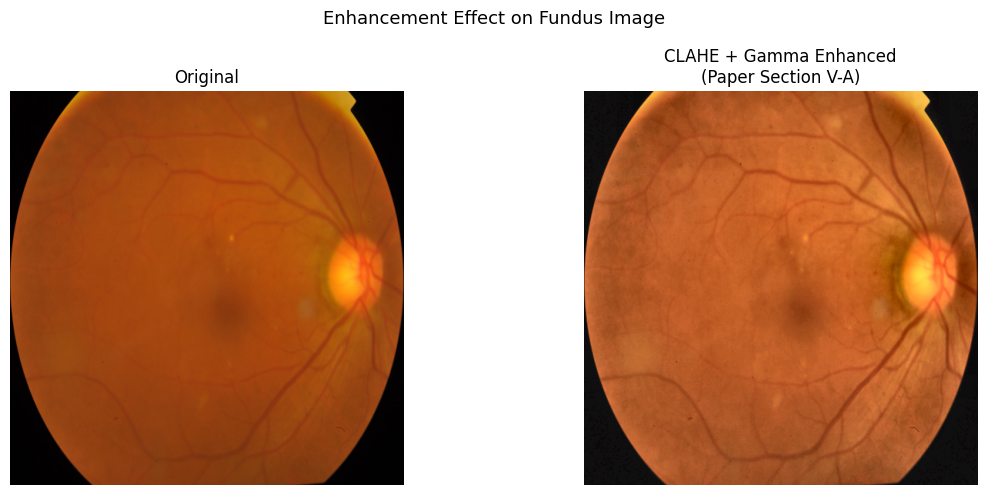

✅ Enhancement function ready


In [ ]:
def enhance_fundus_clahe(image_rgb, clip_limit=2.0, tile_grid=(8, 8), gamma=1.2):
    """
    Paper Section V-A:
      1. CLAHE on L channel of LAB  → local contrast boost
      2. Gamma correction           → recover brightness lost by CLAHE
    Returns enhanced RGB image.
    """
    # Convert to LAB to apply CLAHE only on the lightness channel
    lab = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2LAB)
    L, A, B = cv2.split(lab)

    # Step 1: CLAHE on L channel (paper: "Contrast-Limited Adaptive Histogram Equalization")
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid)
    L_clahe = clahe.apply(L)

    # Step 2: Gamma correction (paper: "compensate for brightness loss from CLAHE")
    L_float   = L_clahe.astype(np.float32) / 255.0
    L_gamma   = np.power(L_float, 1.0 / gamma)
    L_out     = (L_gamma * 255).clip(0, 255).astype(np.uint8)

    # Merge back
    lab_out   = cv2.merge([L_out, A, B])
    enhanced  = cv2.cvtColor(lab_out, cv2.COLOR_LAB2RGB)
    return enhanced


def load_and_enhance(image_path, target_size=512):
    """
    Full preprocessing:
      1. Load + crop black border
      2. Resize
      3. CLAHE + gamma (paper method)
    Returns (enhanced_rgb, original_rgb)
    """
    img_bgr = cv2.imread(str(image_path))
    image   = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    # Crop black border (retinal images have large black margins)
    try:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        _, mask = cv2.threshold(gray, 10, 255, cv2.THRESH_BINARY)
        coords   = cv2.findNonZero(mask)
        x, y, w, h = cv2.boundingRect(coords)
        image    = image[y:y+h, x:x+w]
    except Exception:
        pass

    image   = cv2.resize(image, (target_size, target_size), interpolation=cv2.INTER_AREA)
    enhanced = enhance_fundus_clahe(image)
    return enhanced, image


# ── Demo: show enhancement effect ────────────────────────────────────────────
sample_path = df[df["diagnosis"] == 2].iloc[0]["img_path"]
enhanced_demo, original_demo = load_and_enhance(sample_path)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes[0].imshow(original_demo);  axes[0].set_title("Original");               axes[0].axis("off")
axes[1].imshow(enhanced_demo);  axes[1].set_title("CLAHE + Gamma Enhanced\n(Paper Section V-A)"); axes[1].axis("off")
plt.suptitle("Enhancement Effect on Fundus Image", fontsize=13)
plt.tight_layout(); plt.show()
print("✅ Enhancement function ready")

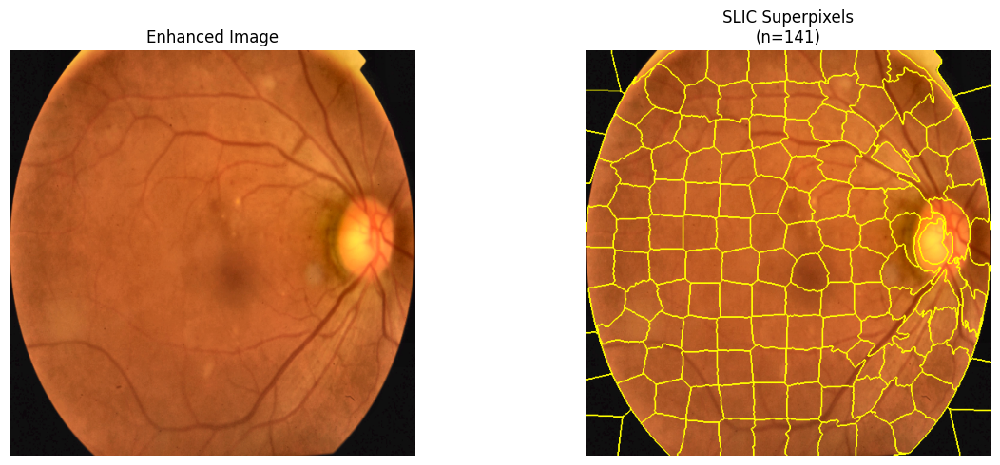

✅ Superpixels: 141


In [ ]:
def generate_superpixels(image_rgb, n_segments=150, compactness=15, sigma=1):
    """
    Paper Section V / Related Work (Boulaabi et al.):
      SLIC in LAB color space so superpixel boundaries respect
      perceptual color differences — lesions (which differ in hue
      from normal retina) get their own superpixels.
    Returns:
      segments : (H, W) int array, superpixel IDs
      n_sp     : actual number of superpixels
    """
    img_lab  = rgb2lab(image_rgb.astype(np.float32) / 255.0)
    segments = slic(
        img_lab,
        n_segments  = n_segments,
        compactness = compactness,
        sigma       = sigma,
        start_label = 0,
        channel_axis= -1
    )
    n_sp = int(segments.max() + 1)
    return segments, n_sp


# ── Demo: show superpixel boundaries ─────────────────────────────────────────
segs_demo, n_sp_demo = generate_superpixels(enhanced_demo, N_SEGMENTS, COMPACTNESS)
boundaries = mark_boundaries(enhanced_demo.astype(np.float32) / 255.0, segs_demo)

fig, axes = plt.subplots(1, 2, figsize=(13, 5))
axes[0].imshow(enhanced_demo);  axes[0].set_title("Enhanced Image");     axes[0].axis("off")
axes[1].imshow(boundaries);     axes[1].set_title(f"SLIC Superpixels\n(n={n_sp_demo})"); axes[1].axis("off")
plt.tight_layout(); plt.show()
print(f"✅ Superpixels: {n_sp_demo}")

=== Vessel-Suppressed Anomaly Maps — All Grades ===



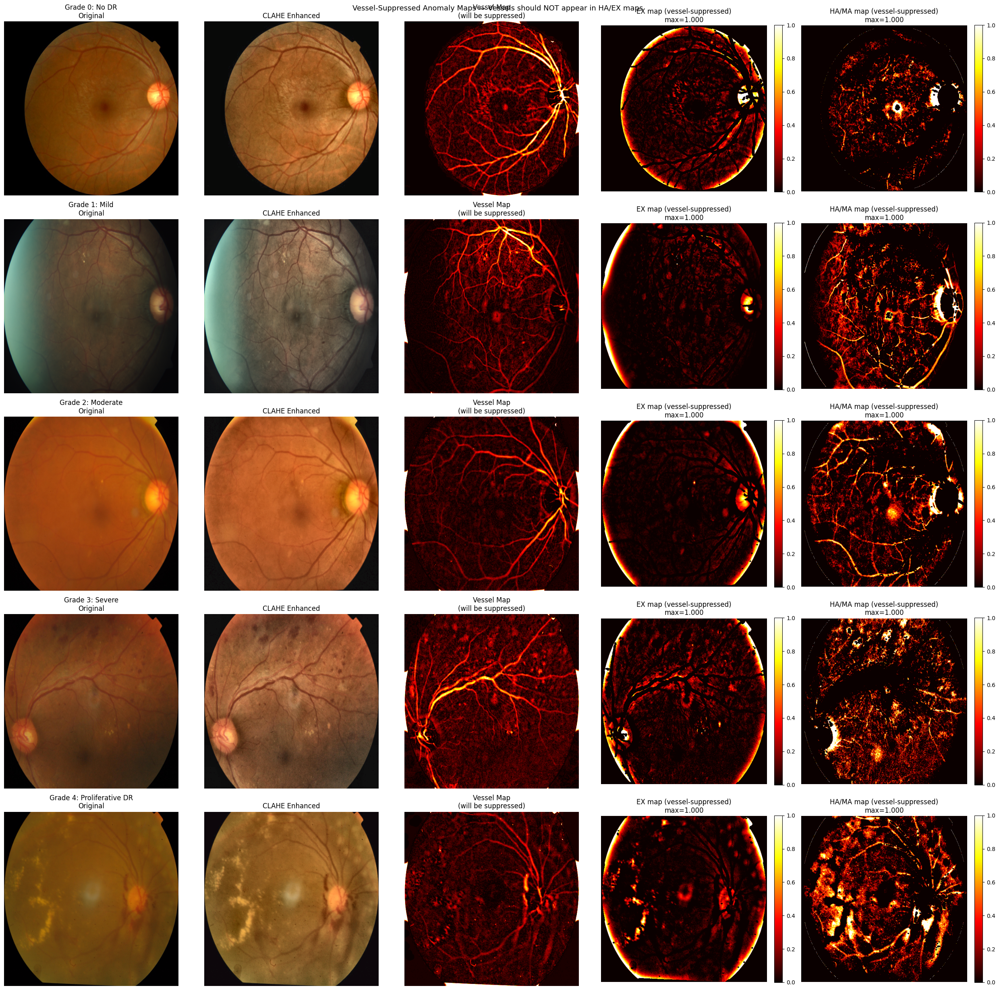

✅ Vessel suppression active
   Vessels should be dark/zero in EX and HA maps
   Only compact bright/dark spots should remain


In [ ]:
def compute_anomaly_maps(image_original):
    """
    V3: Adds explicit vessel detection to suppress vessel false positives.

    Pipeline:
      1. Detect vessels using green channel + Frangi-like top-hat filter
      2. Build vessel mask
      3. Compute Ben Graham anomaly maps
      4. ZERO OUT vessel pixels from both maps before returning
    """
    img_f = image_original.astype(np.float32) / 255.0
    gray  = cv2.cvtColor(image_original, cv2.COLOR_RGB2GRAY).astype(np.float32) / 255.0
    g_ch  = img_f[:, :, 1]
    r_ch  = img_f[:, :, 0]

    # ── Retinal mask ────────────────────────────────────────────────
    retina_mask = (gray > 0.08).astype(np.float32)

    # ── Step 1: Vessel detection using green channel ─────────────────
    # Vessels appear dark in green channel
    # Top-hat transform: highlights thin dark structures (vessels)
    # Black top-hat = morphological closing - original
    #               = finds dark structures smaller than kernel
    g_uint8    = (g_ch * 255).clip(0, 255).astype(np.uint8)

    # Use multiple kernel sizes to catch vessels of different widths
    vessel_mask_combined = np.zeros_like(g_ch, dtype=np.float32)

    for ksize in [7, 13, 21]:
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (ksize, ksize))
        # Black top-hat: closing - original = dark features
        closed  = cv2.morphologyEx(g_uint8, cv2.MORPH_CLOSE, kernel)
        bth     = (closed.astype(np.float32) - g_uint8.astype(np.float32))
        bth     = np.clip(bth / 255.0, 0, 1)
        vessel_mask_combined = np.maximum(vessel_mask_combined, bth)

    # Threshold vessel map
    # Vessels: consistently dark across ALL kernel sizes
    vessel_binary = (vessel_mask_combined > 0.04).astype(np.float32)

    # Dilate vessel mask slightly to cover vessel edges
    dilate_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    vessel_binary = cv2.dilate(vessel_binary, dilate_kernel, iterations=1)

    # ── Step 2: Ben Graham anomaly maps ─────────────────────────────
    # Dark anomaly (HA/MA)
    g_blur       = cv2.GaussianBlur(g_ch, (0, 0), sigmaX=15)
    dark_anomaly = np.clip(g_blur - g_ch, 0, None)
    redness      = np.clip((r_ch - g_ch) / (g_ch + 0.05), 0, 1)
    ha_map_raw   = dark_anomaly * (1.0 + redness * 0.5)

    # Bright anomaly (EX)
    img_blur        = cv2.GaussianBlur(img_f, (0, 0), sigmaX=10)
    response        = img_f - img_blur
    bright_response = np.clip(response.mean(axis=2), 0, None)
    g_blur2         = cv2.GaussianBlur(g_ch, (0, 0), sigmaX=15)
    bright_anomaly  = np.clip(g_ch - g_blur2, 0, None)
    ex_map_raw      = bright_anomaly * 0.5 + bright_response * 0.5

    # ── Step 3: SUPPRESS VESSELS in both maps ─────────────────────
    # This is the key fix — vessels score high on dark anomaly,
    # zeroing them out prevents vessel → lesion false positives
    non_vessel = (1.0 - vessel_binary)
    ha_map_raw = ha_map_raw * non_vessel
    ex_map_raw = ex_map_raw * non_vessel   # vessels can also affect EX map

    # ── Step 4: Normalize within retina ────────────────────────────
    def normalize_within_retina(m, mask):
        vals = m[mask > 0.5]
        if len(vals) == 0:
            return m
        p99 = np.percentile(vals, 99)
        if p99 < 1e-6:
            return m
        return np.clip(m / p99, 0, 1)

    ha_map = normalize_within_retina(ha_map_raw, retina_mask) * retina_mask
    ex_map = normalize_within_retina(ex_map_raw, retina_mask) * retina_mask

    return ex_map.astype(np.float32), ha_map.astype(np.float32)


# ── Verify vessel suppression works ──────────────────────────────────────────
print("=== Vessel-Suppressed Anomaly Maps — All Grades ===\n")
fig, axes = plt.subplots(5, 5, figsize=(25, 25))

for grade in range(5):
    row        = df[df["diagnosis"] == grade].iloc[0]
    enh, orig  = load_and_enhance(row["img_path"])
    ex_m, ha_m = compute_anomaly_maps(orig)

    # Also show vessel mask for debugging
    g_ch    = orig[:, :, 1].astype(np.float32) / 255.0
    g_uint8 = (g_ch * 255).clip(0,255).astype(np.uint8)
    vessel_combined = np.zeros_like(g_ch)
    for ksize in [7, 13, 21]:
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (ksize, ksize))
        closed = cv2.morphologyEx(g_uint8, cv2.MORPH_CLOSE, kernel)
        bth    = np.clip((closed.astype(np.float32) - g_uint8) / 255.0, 0, 1)
        vessel_combined = np.maximum(vessel_combined, bth)

    axes[grade, 0].imshow(orig)
    axes[grade, 0].set_title(f"Grade {grade}: {GRADE_LABELS[grade]}\nOriginal")
    axes[grade, 0].axis("off")

    axes[grade, 1].imshow(enh)
    axes[grade, 1].set_title("CLAHE Enhanced")
    axes[grade, 1].axis("off")

    axes[grade, 2].imshow(vessel_combined, cmap="hot", vmin=0, vmax=0.15)
    axes[grade, 2].set_title(f"Vessel Map\n(will be suppressed)")
    axes[grade, 2].axis("off")

    im3 = axes[grade, 3].imshow(ex_m, cmap="hot", vmin=0, vmax=1)
    axes[grade, 3].set_title(f"EX map (vessel-suppressed)\nmax={ex_m.max():.3f}")
    axes[grade, 3].axis("off")
    plt.colorbar(im3, ax=axes[grade, 3], fraction=0.046, pad=0.04)

    im4 = axes[grade, 4].imshow(ha_m, cmap="hot", vmin=0, vmax=1)
    axes[grade, 4].set_title(f"HA/MA map (vessel-suppressed)\nmax={ha_m.max():.3f}")
    axes[grade, 4].axis("off")
    plt.colorbar(im4, ax=axes[grade, 4], fraction=0.046, pad=0.04)

plt.suptitle("Vessel-Suppressed Anomaly Maps — Vessels should NOT appear in HA/EX maps",
             fontsize=13)
plt.tight_layout()
plt.show()
print("✅ Vessel suppression active")
print("   Vessels should be dark/zero in EX and HA maps")
print("   Only compact bright/dark spots should remain")

In [ ]:
def extract_superpixel_features(image_original, image_enhanced, segments, n_sp):
    """
    30 features per superpixel.
    Now uses compute_anomaly_maps() instead of broken HSV approach.
    """
    H, W     = image_original.shape[:2]
    orig_f   = image_original.astype(np.float32) / 255.0
    enh_f    = image_enhanced.astype(np.float32) / 255.0
    orig_lab = rgb2lab(orig_f)
    orig_hsv = cv2.cvtColor(image_original, cv2.COLOR_RGB2HSV).astype(np.float32) / 255.0
    gray     = cv2.cvtColor(image_original, cv2.COLOR_RGB2GRAY).astype(np.float32) / 255.0

    # Use the new working anomaly maps
    ex_map, ha_map = compute_anomaly_maps(image_original)

    features  = []
    centroids = []

    for sp_id in range(n_sp):
        mask = (segments == sp_id)
        if mask.sum() == 0:
            features.append(np.zeros(30, dtype=np.float32))
            centroids.append((H // 2, W // 2))
            continue

        rows, cols  = np.where(mask)
        cr          = rows.mean() / H
        cc          = cols.mean() / W
        dist_center = np.sqrt((cr - 0.5)**2 + (cc - 0.5)**2)
        norm_area   = mask.sum() / (H * W)
        border      = float(rows.min() < 8 or rows.max() > H - 8 or
                            cols.min() < 8 or cols.max() > W - 8)

        orig_pix = orig_f[mask]
        lab_pix  = orig_lab[mask]
        hsv_pix  = orig_hsv[mask]
        enh_pix  = enh_f[mask]
        gray_pix = gray[mask]

        mean_rgb_o = orig_pix.mean(axis=0)
        std_rgb_o  = orig_pix.std(axis=0)
        mean_lab   = lab_pix.mean(axis=0)
        rg_ratio   = mean_rgb_o[0] / (mean_rgb_o[1] + 1e-6)

        mean_rgb_e = enh_pix.mean(axis=0)
        std_rgb_e  = enh_pix.std(axis=0)

        mean_V = hsv_pix[:, 2].mean()
        mean_S = hsv_pix[:, 1].mean()

        ex_score = float(ex_map[mask].mean())
        ha_score = float(ha_map[mask].mean())

        feat = np.array([
            *mean_rgb_o,
            *std_rgb_o,
            *mean_lab,
            rg_ratio,
            mean_lab[2],
            mean_lab[0],
            *mean_rgb_e,
            *std_rgb_e,
            mean_V,
            mean_S,
            ex_score,
            ha_score,
            cr, cc,
            dist_center,
            norm_area,
            border,
            orig_pix[:, 1].min(),
            gray_pix.mean(),
            gray_pix.std(),
        ], dtype=np.float32)

        features.append(feat)
        centroids.append((rows.mean(), cols.mean()))

    return np.array(features, dtype=np.float32), centroids


# ── Demo ──────────────────────────────────────────────────────────────────────
sample_path = df[df["diagnosis"] == 2].iloc[0]["img_path"]
enhanced_demo, original_demo = load_and_enhance(sample_path)
segs_demo, n_sp_demo = generate_superpixels(enhanced_demo, N_SEGMENTS, COMPACTNESS, SIGMA)

feats_demo, cents_demo = extract_superpixel_features(
    original_demo, enhanced_demo, segs_demo, n_sp_demo
)
print(f"✅ Feature matrix: {feats_demo.shape}  ({n_sp_demo} nodes × 30 features)")

✅ Feature matrix: (141, 30)  (141 nodes × 30 features)


=== GRADE-AWARE PSEUDO-LABEL VERIFICATION ===

   Grade 0 | lesion top 2% | combined thresh: 0.3832 | floor: 0.05
   EX thresh: 0.3251 | HA thresh: 0.2526
   Pseudo → Lesion:   2 | BG: 112 | Uncertain:  25 | Total:139
   Grade 1 | lesion top 5% | combined thresh: 0.2609 | floor: 0.05
   EX thresh: 0.0555 | HA thresh: 0.2817
   Pseudo → Lesion:   5 | BG: 109 | Uncertain:  25 | Total:139
   Grade 2 | lesion top 8% | combined thresh: 0.1192 | floor: 0.05
   EX thresh: 0.0486 | HA thresh: 0.1412
   Pseudo → Lesion:   7 | BG: 112 | Uncertain:  22 | Total:141
   Grade 3 | lesion top 11% | combined thresh: 0.1560 | floor: 0.05
   EX thresh: 0.0816 | HA thresh: 0.1836
   Pseudo → Lesion:  10 | BG: 111 | Uncertain:  19 | Total:140
   Grade 4 | lesion top 14% | combined thresh: 0.2433 | floor: 0.05
   EX thresh: 0.0595 | HA thresh: 0.2754
   Pseudo → Lesion:  12 | BG: 104 | Uncertain:  17 | Total:133


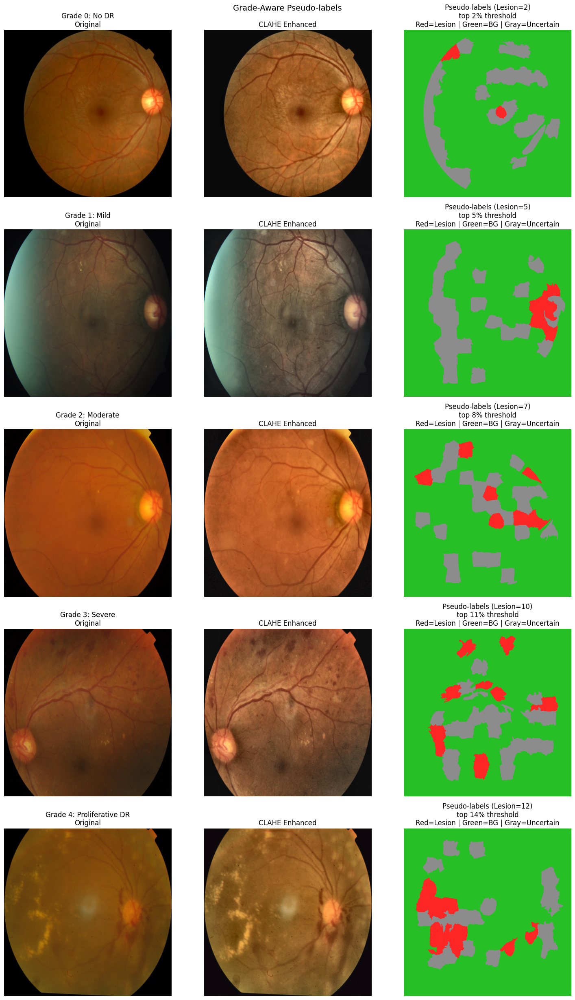

✅ Grade 0 should have fewer lesions than Grade 4


In [ ]:
def generate_pseudo_labels(image_original, image_enhanced, segments, n_sp,
                            dr_grade=None):
    """
    Grade-aware pseudo-label generation.

    Key improvements:
    1. Grade prior: lesion percentile threshold tightens for low grades
       Grade 0 → top 2%  (very few, only strongest anomalies)
       Grade 1 → top 5%
       Grade 2 → top 8%
       Grade 3 → top 11%
       Grade 4 → top 14%
    2. Vessel rejection strengthened: uses aspect ratio + green darkness
    3. Grade 0 gets extra validation: lesion must be BOTH bright/dark
       anomaly AND spatially compact (not a vessel/edge artifact)
    4. Minimum anomaly floor: even if in top percentile, score must
       exceed a minimum absolute value to be called lesion
    """
    H, W     = image_original.shape[:2]
    gray     = cv2.cvtColor(image_original, cv2.COLOR_RGB2GRAY).astype(np.float32) / 255.0
    orig_f   = image_original.astype(np.float32) / 255.0
    orig_lab = rgb2lab(orig_f)

    ex_map, ha_map = compute_anomaly_maps(image_original)

    # ── Grade-dependent lesion percentile ────────────────────────────
    # How many SPs (%) get labeled as lesion based on DR severity
    grade_to_lesion_pct = {0: 2.0, 1: 5.0, 2: 8.0, 3: 11.0, 4: 14.0}
    if dr_grade is None:
        lesion_pct = 8.0   # default to moderate
    else:
        lesion_pct = grade_to_lesion_pct.get(int(dr_grade), 8.0)

    lesion_percentile = 100.0 - lesion_pct   # e.g. grade 0 → 98th percentile
    bg_percentile     = 65.0                  # bottom 65% = definite background

    # ── Optic disc detection ──────────────────────────────────────────
    sp_bright = []
    for i in range(n_sp):
        m = (segments == i)
        sp_bright.append(float(gray[m].mean()) if m.sum() > 0 else 0.0)
    disc_sp  = int(np.argmax(sp_bright))
    disc_m   = (segments == disc_sp)
    disc_r   = float(np.where(disc_m)[0].mean() / H) if disc_m.sum() > 0 else 0.5
    disc_c   = float(np.where(disc_m)[1].mean() / W) if disc_m.sum() > 0 else 0.5

    def near_disc(cr, cc, r=0.11):
        return np.sqrt((cr - disc_r)**2 + (cc - disc_c)**2) < r

    # ── Per-superpixel analysis ───────────────────────────────────────
    sp_data = []

    for sp_id in range(n_sp):
        m = (segments == sp_id)
        if m.sum() == 0:
            sp_data.append(None)
            continue

        rows, cols   = np.where(m)
        cr           = float(rows.mean() / H)
        cc           = float(cols.mean() / W)
        dist_center  = float(np.sqrt((cr - 0.5)**2 + (cc - 0.5)**2))
        mean_gray    = float(gray[m].mean())
        sp_area      = int(m.sum())

        # Shape analysis
        sp_h        = int(rows.max() - rows.min() + 1)
        sp_w        = int(cols.max() - cols.min() + 1)
        elongation  = max(sp_h / (sp_w + 1e-6), sp_w / (sp_h + 1e-6))
        # Compactness: circle has compactness=1, elongated shapes > 1
        perimeter_approx = 2 * (sp_h + sp_w)
        compactness = (perimeter_approx ** 2) / (4 * np.pi * sp_area + 1e-6)

        orig_pix = orig_f[m]
        mean_r   = float(orig_pix[:, 0].mean())
        mean_g   = float(orig_pix[:, 1].mean())
        mean_b   = float(orig_pix[:, 2].mean())
        rg_ratio = mean_r / (mean_g + 1e-6)

        ex_score = float(ex_map[m].mean())
        ha_score = float(ha_map[m].mean())

        # Combined anomaly score (max of EX and HA)
        combined_score = max(ex_score, ha_score * 0.8)

        # Hard background flags
        is_black  = mean_gray < 0.08
        is_edge   = dist_center > 0.44
        is_border = (rows.min() < 5 or rows.max() > H - 5 or
                     cols.min() < 5 or cols.max() > W - 5)
        is_disc_region = near_disc(cr, cc, r=0.10)

        # Vessel detection: elongated + dark green
        # Real vessels: elongation > 3, darker than surroundings
        is_vessel = (elongation > 3.0 and mean_gray < 0.50)

        # Large blob = likely vessel cluster or artifact, not lesion
        is_too_large = sp_area > (H * W * 0.025)

        # Small = lesion-like
        is_small = sp_area < (H * W * 0.015)

        is_retina = not (is_black or is_edge or is_border)

        sp_data.append({
            "id"           : sp_id,
            "cr"           : cr,
            "cc"           : cc,
            "ex_score"     : ex_score,
            "ha_score"     : ha_score,
            "combined"     : combined_score,
            "rg_ratio"     : rg_ratio,
            "is_small"     : is_small,
            "is_too_large" : is_too_large,
            "is_retina"    : is_retina,
            "is_vessel"    : is_vessel,
            "is_disc"      : is_disc_region,
            "is_black"     : is_black,
            "is_edge"      : is_edge,
            "elongation"   : elongation,
            "compactness"  : compactness,
            "mean_gray"    : mean_gray,
        })

    # ── Compute thresholds from CLEAN retina SPs only ─────────────────
    # Exclude: black, edge, vessel, disc, too-large blobs
    clean_ids = [
        i for i, s in enumerate(sp_data)
        if s is not None
        and s["is_retina"]
        and not s["is_vessel"]
        and not s["is_disc"]
        and not s["is_too_large"]
    ]

    clean_combined = [sp_data[i]["combined"] for i in clean_ids]
    clean_ex       = [sp_data[i]["ex_score"] for i in clean_ids]
    clean_ha       = [sp_data[i]["ha_score"] for i in clean_ids]

    if not clean_combined:
        print("   ⚠️  No clean superpixels found")
        return torch.zeros(n_sp, dtype=torch.long), 0

    # Grade-dependent lesion threshold (percentile)
    lesion_thresh_combined = float(np.percentile(clean_combined, lesion_percentile))
    lesion_thresh_ex       = float(np.percentile(clean_ex,       lesion_percentile))
    lesion_thresh_ha       = float(np.percentile(clean_ha,       lesion_percentile))
    bg_thresh              = float(np.percentile(clean_combined, bg_percentile))

    # Absolute floor: prevent labeling near-zero anomalies as lesion
    # (important for grade 0 — even top 2% might be nearly zero)
    abs_floor_combined = 0.05
    abs_floor_ex       = 0.04
    abs_floor_ha       = 0.08

    print(f"   Grade {dr_grade} | lesion top {lesion_pct:.0f}% "
          f"| combined thresh: {lesion_thresh_combined:.4f} "
          f"| floor: {abs_floor_combined}")
    print(f"   EX thresh: {lesion_thresh_ex:.4f} | "
          f"HA thresh: {lesion_thresh_ha:.4f}")

    labels = np.full(n_sp, -1, dtype=np.int64)

    for sp_id in range(n_sp):
        s = sp_data[sp_id]
        if s is None:
            labels[sp_id] = 0
            continue

        # ── Hard background ───────────────────────────────────────────
        if s["is_black"] or s["is_edge"] or not s["is_retina"]:
            labels[sp_id] = 0
            continue
        if s["is_disc"]:
            labels[sp_id] = 0
            continue
        if s["is_vessel"]:
            labels[sp_id] = 0
            continue
        if s["is_too_large"]:
            labels[sp_id] = 0
            continue

        # ── Lesion candidate checks ───────────────────────────────────
        above_combined = s["combined"] >= lesion_thresh_combined
        above_abs      = s["combined"] >= abs_floor_combined

        # EX lesion: bright anomaly above threshold + not disc
        above_ex = (s["ex_score"] >= lesion_thresh_ex and
                    s["ex_score"] >= abs_floor_ex and
                    not near_disc(s["cr"], s["cc"], r=0.13))

        # HA/MA lesion: dark anomaly + reddish + small + not vessel
        above_ha = (s["ha_score"] >= lesion_thresh_ha and
                    s["ha_score"] >= abs_floor_ha and
                    s["rg_ratio"] > 1.01 and
                    s["is_small"] and
                    s["elongation"] < 3.5 and
                    not near_disc(s["cr"], s["cc"], r=0.10))

        is_lesion = above_combined and above_abs and (above_ex or above_ha)

        if is_lesion:
            labels[sp_id] = 1
            continue

        # ── Background ───────────────────────────────────────────────
        if s["combined"] < bg_thresh:
            labels[sp_id] = 0
            continue

        # ── Uncertain (middle range) ──────────────────────────────────
        # labels stays -1

    n_les = int((labels == 1).sum())
    n_bg  = int((labels == 0).sum())
    n_unc = int((labels == -1).sum())
    print(f"   Pseudo → Lesion:{n_les:>4} | BG:{n_bg:>4} "
          f"| Uncertain:{n_unc:>4} | Total:{n_sp}")
    return torch.tensor(labels, dtype=torch.long), n_les


# ── Verify on all grades ──────────────────────────────────────────────────────
print("=== GRADE-AWARE PSEUDO-LABEL VERIFICATION ===\n")
fig, axes = plt.subplots(5, 3, figsize=(15, 25))

for grade in range(5):
    row           = df[df["diagnosis"] == grade].iloc[0]
    enh, orig     = load_and_enhance(row["img_path"])
    segs, n_sp    = generate_superpixels(enh, N_SEGMENTS, COMPACTNESS, SIGMA)
    pseudo, n_les = generate_pseudo_labels(orig, enh, segs, n_sp, dr_grade=grade)

    H, W = orig.shape[:2]
    vis  = np.zeros((H, W, 3), dtype=np.float32)
    for sp_id in range(n_sp):
        m   = (segs == sp_id)
        lbl = pseudo[sp_id].item()
        if lbl == 1:   vis[m] = [1.0, 0.15, 0.15]
        elif lbl == 0: vis[m] = [0.15, 0.75, 0.15]
        else:          vis[m] = [0.55, 0.55, 0.55]

    axes[grade, 0].imshow(orig)
    axes[grade, 0].set_title(f"Grade {grade}: {GRADE_LABELS[grade]}\nOriginal")
    axes[grade, 0].axis("off")

    axes[grade, 1].imshow(enh)
    axes[grade, 1].set_title("CLAHE Enhanced")
    axes[grade, 1].axis("off")

    axes[grade, 2].imshow(vis)
    axes[grade, 2].set_title(
        f"Pseudo-labels (Lesion={n_les})\n"
        f"top {100 - (100 - [2,5,8,11,14][grade]):.0f}% threshold\n"
        "Red=Lesion | Green=BG | Gray=Uncertain"
    )
    axes[grade, 2].axis("off")

plt.suptitle("Grade-Aware Pseudo-labels", fontsize=14)
plt.tight_layout()
plt.show()
print("✅ Grade 0 should have fewer lesions than Grade 4")

In [ ]:
def build_knn_graph(features, centroids, k=8):
    """
    Build spatial k-NN graph over superpixel centroids.
    Each node = one superpixel.
    Each edge = proximity between superpixels.
    Features are normalized (zero mean, unit std) per column.
    """
    n = len(centroids)
    if n < 2:
        x = torch.zeros(1, features.shape[1])
        return Data(x=x, edge_index=torch.zeros(2, 0, dtype=torch.long))

    coords   = np.array(centroids, dtype=np.float32)
    k_actual = min(k + 1, n)

    nbrs = NearestNeighbors(n_neighbors=k_actual, algorithm="ball_tree")
    nbrs.fit(coords)
    distances, indices = nbrs.kneighbors(coords)

    src, dst, wts = [], [], []
    for i in range(n):
        for j in range(1, k_actual):
            src.append(i)
            dst.append(int(indices[i, j]))
            wts.append(float(distances[i, j]))

    edge_index = torch.tensor([src, dst], dtype=torch.long)
    edge_attr  = torch.tensor(wts, dtype=torch.float32).unsqueeze(1)

    # Normalize features
    x    = torch.tensor(features, dtype=torch.float32)
    mean = x.mean(dim=0, keepdim=True)
    std  = x.std(dim=0, keepdim=True).clamp(min=1e-8)
    x    = (x - mean) / std

    return Data(x=x, edge_index=edge_index, edge_attr=edge_attr)


# ── Demo ─────────────────────────────────────────────────────────────────────
graph_demo = build_knn_graph(feats_demo, cents_demo, k=K_NEIGHBOURS)
print(f"✅ Graph: {graph_demo.num_nodes} nodes, {graph_demo.num_edges} edges")
print(f"   Node feature dim : {graph_demo.x.shape[1]}")
print(f"   Edge feature dim : {graph_demo.edge_attr.shape[1]}")

✅ Graph: 141 nodes, 1128 edges
   Node feature dim : 30
   Edge feature dim : 1


In [ ]:
class LesionGAT(nn.Module):
    """
    Graph Attention Network for superpixel lesion classification.

    Paper alignment:
      - Uses attention mechanism to weight neighbour superpixels
        (analogous to how clinicians focus on suspicious regions)
      - Residual connections prevent gradient vanishing
      - LayerNorm for stable training on small graphs
      - Two-layer classifier head for richer decision boundary

    Input  : 30-dim superpixel feature vector
    Output : 2-class logits (0=background, 1=lesion)
    """

    def __init__(self, in_channels, hidden=128, n_classes=2,
                 n_layers=3, heads=4, dropout=0.2):
        super().__init__()
        self.dropout = dropout

        # Input projection
        self.proj = nn.Sequential(
            nn.Linear(in_channels, hidden),
            nn.LayerNorm(hidden),
            nn.ELU(),
            nn.Dropout(dropout)
        )

        # GAT layers with residual connections
        self.convs    = nn.ModuleList()
        self.norms    = nn.ModuleList()
        self.proj_res = nn.ModuleList()

        for i in range(n_layers):
            in_ch = hidden * heads if i > 0 else hidden
            self.convs.append(
                GATConv(in_ch, hidden, heads=heads, dropout=dropout, concat=True)
            )
            self.norms.append(nn.LayerNorm(hidden * heads))
            self.proj_res.append(
                nn.Linear(in_ch, hidden * heads, bias=False)
                if in_ch != hidden * heads else nn.Identity()
            )

        final_dim = hidden * heads

        # Two-layer classifier
        self.clf = nn.Sequential(
            nn.Linear(final_dim, final_dim // 2),
            nn.LayerNorm(final_dim // 2),
            nn.ELU(),
            nn.Dropout(dropout),
            nn.Linear(final_dim // 2, n_classes)
        )

    def forward(self, x, edge_index, edge_attr=None, batch=None):
        x = self.proj(x)
        for conv, norm, proj_r in zip(self.convs, self.norms, self.proj_res):
            residual = proj_r(x)
            h = conv(x, edge_index)
            h = norm(h)
            h = F.elu(h)
            h = F.dropout(h, p=self.dropout, training=self.training)
            x = h + residual
        return self.clf(x)


# ── Quick shape test ──────────────────────────────────────────────────────────
_model_test = LesionGAT(in_channels=30, hidden=HIDDEN_DIM,
                         n_layers=NUM_LAYERS, heads=NUM_HEADS, dropout=DROPOUT).to(DEVICE)
_g          = graph_demo.to(DEVICE)
_out        = _model_test(_g.x, _g.edge_index, _g.edge_attr)
print(f"✅ Model output shape: {_out.shape}  (should be [{graph_demo.num_nodes}, 2])")
del _model_test, _g, _out

✅ Model output shape: torch.Size([141, 2])  (should be [141, 2])


In [ ]:
def train_on_image(image_path, device=DEVICE, dr_grade=None):
    enhanced, original = load_and_enhance(image_path, IMG_SIZE)
    segments, n_sp     = generate_superpixels(enhanced, N_SEGMENTS, COMPACTNESS, SIGMA)
    features, centroids= extract_superpixel_features(original, enhanced, segments, n_sp)
    graph              = build_knn_graph(features, centroids, K_NEIGHBOURS).to(device)

    # Pass grade for grade-aware pseudo-labeling
    pseudo, n_lesion   = generate_pseudo_labels(
        original, enhanced, segments, n_sp, dr_grade=dr_grade
    )
    pseudo             = pseudo.to(device)
    mask               = (pseudo != -1)
    n_confident        = mask.sum().item()

    if n_confident < 5:
        print("   ⚠️  Too few confident pseudo-labels — skipping")
        return original, segments, np.zeros(n_sp), np.zeros(n_sp), []

    n_bg_lbl  = (pseudo[mask] == 0).sum().item()
    n_les_lbl = (pseudo[mask] == 1).sum().item()
    les_w     = float(np.clip(
        n_bg_lbl / (n_les_lbl + 1e-6), 5.0, 50.0
    )) if n_les_lbl > 0 else 10.0

    cls_w = torch.tensor([1.0, les_w], device=device)
    print(f"   Weights → [BG=1.0, Lesion={les_w:.1f}]  "
          f"(BG={n_bg_lbl}, Lesion={n_les_lbl})")

    in_ch = graph.x.shape[1]
    model = LesionGAT(in_ch, HIDDEN_DIM, 2, NUM_LAYERS, NUM_HEADS, DROPOUT).to(device)
    opt   = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=5e-4)
    sched = torch.optim.lr_scheduler.CosineAnnealingLR(opt, T_max=EPOCHS, eta_min=1e-5)

    loss_curve = []
    model.train()
    for ep in range(EPOCHS):
        opt.zero_grad()
        logits      = model(graph.x, graph.edge_index, graph.edge_attr)
        smooth      = 0.1
        targets_f   = pseudo[mask].float()
        soft_2class = torch.stack(
            [1 - targets_f * (1 - smooth) - smooth / 2,
               targets_f * (1 - smooth) + smooth / 2], dim=1
        )
        log_probs   = F.log_softmax(logits[mask], dim=1)
        weights     = cls_w[pseudo[mask]]
        loss        = (-(soft_2class * log_probs).sum(dim=1) * weights).mean()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        opt.step(); sched.step()
        loss_curve.append(loss.item())

    model.eval()
    with torch.no_grad():
        logits = model(graph.x, graph.edge_index, graph.edge_attr)
        probs  = F.softmax(logits, dim=1)[:, 1].cpu().numpy()
        preds  = (probs > 0.40).astype(np.int64)

    print(f"   Final loss: {loss_curve[-1]:.4f} | "
          f"Lesion SPs predicted: {preds.sum()}/{n_sp}")
    return original, segments, preds, probs, loss_curve

print("✅ Grade-aware training function ready")

✅ Grade-aware training function ready


In [ ]:
def visualize_results(image, segments, preds, probs, loss_curve,
                      pseudo_labels=None, title=""):
    H, W  = image.shape[:2]
    n_sp  = len(preds)

    pred_map = np.zeros((H, W), dtype=np.uint8)
    prob_map = np.zeros((H, W), dtype=np.float32)
    for sp_id in range(n_sp):
        m = (segments == sp_id)
        pred_map[m] = int(preds[sp_id])
        prob_map[m] = float(probs[sp_id])

    ncols = 5 if pseudo_labels is not None else 4
    fig, axes = plt.subplots(1, ncols, figsize=(6 * ncols, 5))
    fig.suptitle(title, fontsize=13)
    col = 0

    # Panel 1: Original
    axes[col].imshow(image); axes[col].set_title("Original Fundus"); axes[col].axis("off"); col += 1

    # Panel 2: Pseudo-labels
    if pseudo_labels is not None:
        vis = np.zeros((H, W, 3), dtype=np.float32)
        for sp_id in range(n_sp):
            m   = (segments == sp_id)
            lbl = pseudo_labels[sp_id].item() if hasattr(pseudo_labels[sp_id], 'item') else int(pseudo_labels[sp_id])
            if lbl == 1:   vis[m] = [1.0, 0.2, 0.2]
            elif lbl == 0: vis[m] = [0.2, 0.8, 0.2]
            else:          vis[m] = [0.5, 0.5, 0.5]
        axes[col].imshow(vis)
        axes[col].set_title("HSV Pseudo-labels\nRed=Lesion | Green=BG | Gray=Uncertain")
        axes[col].axis("off"); col += 1

    # Panel 3: GAT predictions overlay
    overlay = image.astype(np.float32) / 255.0
    overlay[pred_map.astype(bool)] = (
        overlay[pred_map.astype(bool)] * 0.3 + np.array([1.0, 0.1, 0.1]) * 0.7
    )
    axes[col].imshow(np.clip(overlay, 0, 1))
    axes[col].set_title(f"GAT Lesion Predictions\n({int(preds.sum())}/{n_sp} SPs)")
    axes[col].axis("off"); col += 1

    # Panel 4: Probability heatmap
    im = axes[col].imshow(prob_map, cmap="hot", vmin=0, vmax=1)
    plt.colorbar(im, ax=axes[col], fraction=0.046, pad=0.04)
    axes[col].set_title("Lesion Probability Heatmap"); axes[col].axis("off"); col += 1

    # Panel 5: Loss curve
    axes[col].plot(loss_curve, color="steelblue", lw=1.5)
    axes[col].set_title("Training Loss Curve")
    axes[col].set_xlabel("Epoch"); axes[col].set_ylabel("Loss")
    axes[col].grid(True, alpha=0.3)

    plt.tight_layout(); plt.show()


print("✅ Visualization function ready")

✅ Visualization function ready


Image : 1b8ad0afe9fb
Grade : 2 — Moderate
──────────────────────────────────────────────────
   Grade None | lesion top 8% | combined thresh: 0.2099 | floor: 0.05
   EX thresh: 0.1328 | HA thresh: 0.2274
   Pseudo → Lesion:   7 | BG: 113 | Uncertain:  22 | Total:142
   Grade None | lesion top 8% | combined thresh: 0.2099 | floor: 0.05
   EX thresh: 0.1328 | HA thresh: 0.2274
   Pseudo → Lesion:   7 | BG: 113 | Uncertain:  22 | Total:142
   Weights → [BG=1.0, Lesion=16.1]  (BG=113, Lesion=7)
   Final loss: 0.4063 | Lesion SPs predicted: 7/142


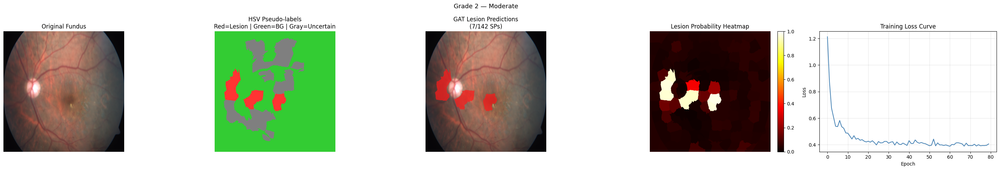

In [ ]:
sample_row  = df[df["diagnosis"] == 2].iloc[2]
sample_path = sample_row["img_path"]

print(f"Image : {sample_row['id_code']}")
print(f"Grade : {sample_row['diagnosis']} — {sample_row['grade_name']}")
print("─" * 50)

# Get pseudo-labels separately for display
enh_s, orig_s = load_and_enhance(sample_path)
segs_s, n_sp_s = generate_superpixels(enh_s)
feats_s, cents_s = extract_superpixel_features(orig_s, enh_s, segs_s, n_sp_s)
pseudo_s, _ = generate_pseudo_labels(orig_s, enh_s, segs_s, n_sp_s)

# Full training
image_out, segs_out, preds_out, probs_out, losses = train_on_image(sample_path)

visualize_results(
    image_out, segs_out, preds_out, probs_out, losses,
    pseudo_labels=pseudo_s,
    title=f"Grade {sample_row['diagnosis']} — {sample_row['grade_name']}"
)


Grade 0: No DR
   Grade 0 | lesion top 2% | combined thresh: 0.1711 | floor: 0.05
   EX thresh: 0.1223 | HA thresh: 0.2139
   Pseudo → Lesion:   2 | BG: 109 | Uncertain:  25 | Total:136
   Grade 0 | lesion top 2% | combined thresh: 0.1711 | floor: 0.05
   EX thresh: 0.1223 | HA thresh: 0.2139
   Pseudo → Lesion:   2 | BG: 109 | Uncertain:  25 | Total:136
   Weights → [BG=1.0, Lesion=50.0]  (BG=109, Lesion=2)
   Final loss: 0.3885 | Lesion SPs predicted: 3/136


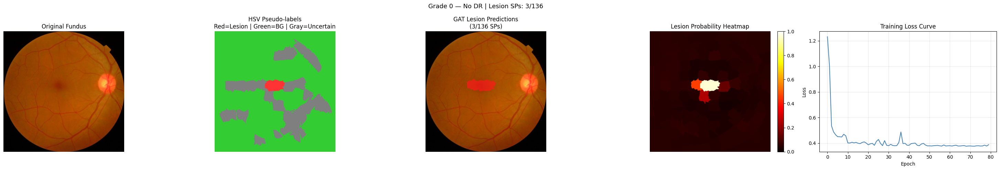


Grade 1: Mild
   Grade 1 | lesion top 5% | combined thresh: 0.1718 | floor: 0.05
   EX thresh: 0.1053 | HA thresh: 0.2148
   Pseudo → Lesion:   4 | BG: 108 | Uncertain:  23 | Total:135
   Grade 1 | lesion top 5% | combined thresh: 0.1718 | floor: 0.05
   EX thresh: 0.1053 | HA thresh: 0.2148
   Pseudo → Lesion:   4 | BG: 108 | Uncertain:  23 | Total:135
   Weights → [BG=1.0, Lesion=27.0]  (BG=108, Lesion=4)
   Final loss: 0.4115 | Lesion SPs predicted: 7/135


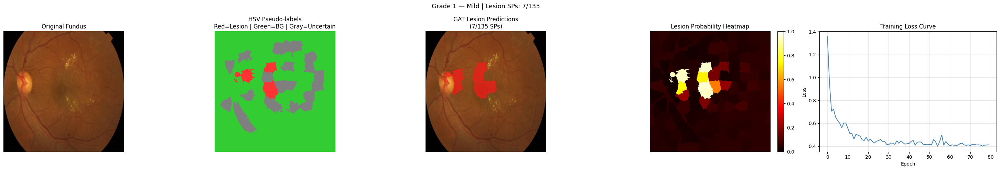


Grade 2: Moderate
   Grade 2 | lesion top 8% | combined thresh: 0.1722 | floor: 0.05
   EX thresh: 0.0476 | HA thresh: 0.2009
   Pseudo → Lesion:   7 | BG: 106 | Uncertain:  21 | Total:134
   Grade 2 | lesion top 8% | combined thresh: 0.1722 | floor: 0.05
   EX thresh: 0.0476 | HA thresh: 0.2009
   Pseudo → Lesion:   7 | BG: 106 | Uncertain:  21 | Total:134
   Weights → [BG=1.0, Lesion=15.1]  (BG=106, Lesion=7)
   Final loss: 0.3988 | Lesion SPs predicted: 18/134


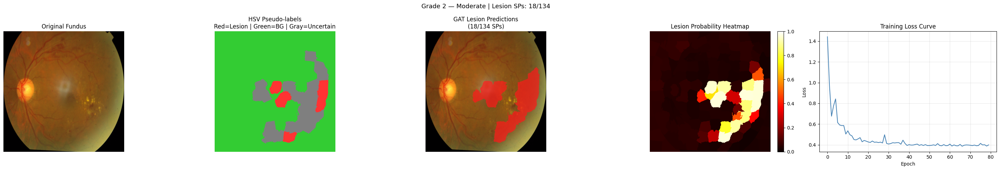


Grade 3: Severe
   Grade 3 | lesion top 11% | combined thresh: 0.1193 | floor: 0.05
   EX thresh: 0.0715 | HA thresh: 0.1491
   Pseudo → Lesion:   9 | BG: 110 | Uncertain:  18 | Total:137
   Grade 3 | lesion top 11% | combined thresh: 0.1193 | floor: 0.05
   EX thresh: 0.0715 | HA thresh: 0.1491
   Pseudo → Lesion:   9 | BG: 110 | Uncertain:  18 | Total:137
   Weights → [BG=1.0, Lesion=12.2]  (BG=110, Lesion=9)
   Final loss: 0.3983 | Lesion SPs predicted: 13/137


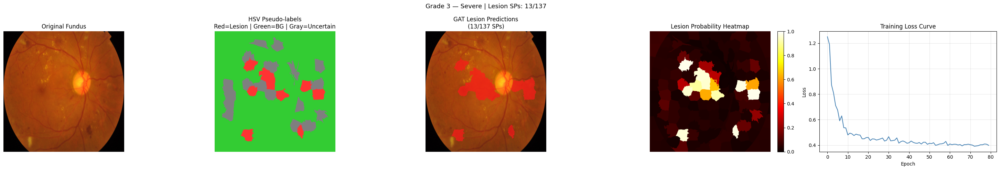


Grade 4: Proliferative DR
   Grade 4 | lesion top 14% | combined thresh: 0.1646 | floor: 0.05
   EX thresh: 0.0337 | HA thresh: 0.2057
   Pseudo → Lesion:  11 | BG: 110 | Uncertain:  16 | Total:137
   Grade 4 | lesion top 14% | combined thresh: 0.1646 | floor: 0.05
   EX thresh: 0.0337 | HA thresh: 0.2057
   Pseudo → Lesion:  11 | BG: 110 | Uncertain:  16 | Total:137
   Weights → [BG=1.0, Lesion=10.0]  (BG=110, Lesion=11)
   Final loss: 0.4051 | Lesion SPs predicted: 16/137


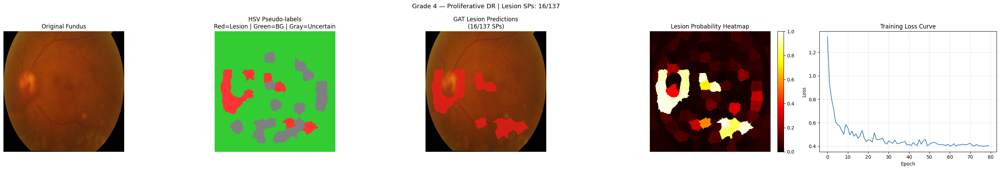


✅ All grades processed

📊 Results Summary:
 grade       grade_name  n_sp  lesion_sp  lesion_pct  final_loss
     0            No DR   136          3        2.21      0.3885
     1             Mild   135          7        5.19      0.4115
     2         Moderate   134         18       13.43      0.3988
     3           Severe   137         13        9.49      0.3983
     4 Proliferative DR   137         16       11.68      0.4051


In [ ]:
results_summary = []

for grade in range(5):
    print(f"\n{'='*55}")
    print(f"Grade {grade}: {GRADE_LABELS[grade]}")
    print(f"{'='*55}")

    row  = df[df["diagnosis"] == grade].iloc[1]
    path = row["img_path"]

    # Pseudo-labels for visualization
    enh_g, orig_g    = load_and_enhance(path)
    segs_g, n_sp_g   = generate_superpixels(enh_g)
    _, _             = extract_superpixel_features(orig_g, enh_g, segs_g, n_sp_g)
    pseudo_g, _      = generate_pseudo_labels(
        orig_g, enh_g, segs_g, n_sp_g, dr_grade=grade   # ← pass grade
    )

    # Full pipeline with grade
    img_g, segs_g2, preds_g, probs_g, losses_g = train_on_image(
        path, device=DEVICE, dr_grade=grade              # ← pass grade
    )

    lesion_pct = 100.0 * preds_g.sum() / max(len(preds_g), 1)
    results_summary.append({
        "grade"      : grade,
        "grade_name" : GRADE_LABELS[grade],
        "n_sp"       : len(preds_g),
        "lesion_sp"  : int(preds_g.sum()),
        "lesion_pct" : round(lesion_pct, 2),
        "final_loss" : round(losses_g[-1], 4) if losses_g else 0.0,
    })

    visualize_results(
        img_g, segs_g2, preds_g, probs_g, losses_g,
        pseudo_labels=pseudo_g,
        title=f"Grade {grade} — {GRADE_LABELS[grade]} | "
              f"Lesion SPs: {int(preds_g.sum())}/{len(preds_g)}"
    )

print("\n✅ All grades processed")
results_df = pd.DataFrame(results_summary)
print("\n📊 Results Summary:")
print(results_df.to_string(index=False))

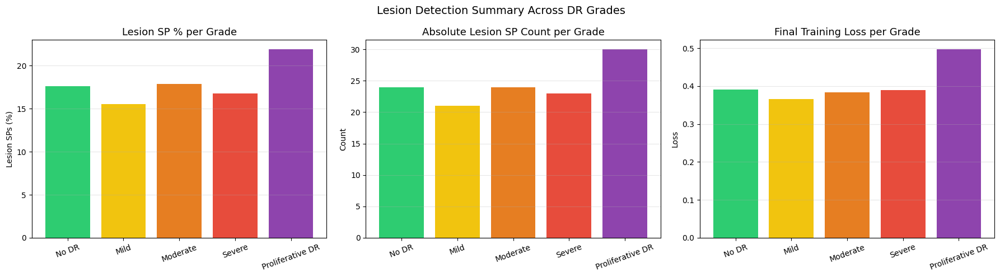

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
colors = ["#2ecc71", "#f1c40f", "#e67e22", "#e74c3c", "#8e44ad"]

axes[0].bar(results_df["grade_name"], results_df["lesion_pct"], color=colors)
axes[0].set_title("Lesion SP % per Grade", fontsize=13)
axes[0].set_ylabel("Lesion SPs (%)"); axes[0].tick_params(axis="x", rotation=20)
axes[0].grid(axis="y", alpha=0.3)

axes[1].bar(results_df["grade_name"], results_df["lesion_sp"], color=colors)
axes[1].set_title("Absolute Lesion SP Count per Grade", fontsize=13)
axes[1].set_ylabel("Count"); axes[1].tick_params(axis="x", rotation=20)
axes[1].grid(axis="y", alpha=0.3)

axes[2].bar(results_df["grade_name"], results_df["final_loss"], color=colors)
axes[2].set_title("Final Training Loss per Grade", fontsize=13)
axes[2].set_ylabel("Loss"); axes[2].tick_params(axis="x", rotation=20)
axes[2].grid(axis="y", alpha=0.3)

plt.suptitle("Lesion Detection Summary Across DR Grades", fontsize=14)
plt.tight_layout(); plt.show()